In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
X = np.array([
    [-2,4,-1],
    [4,1,-1],
    [1, 6, -1],
    [2, 4, -1],
    [6, 2, -1],

])

y = np.array([-1,-1,1,1,1])

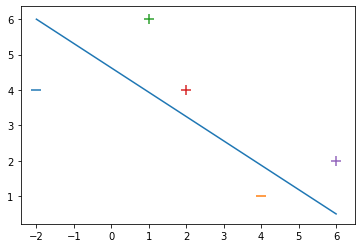

In [4]:
for d, sample in enumerate(X):
    # Plot the negative samples
    if d < 2:
        plt.scatter(sample[0], sample[1], s=120, marker='_', linewidths=2)
    # Plot the positive samples
    else:
        plt.scatter(sample[0], sample[1], s=120, marker='+', linewidths=2)

# Print a possible hyperplane, that is seperating the two classes.
plt.plot([-2,6],[6,0.5])

## Objective Function & Gradient

* Hinge Loss:
    * 0 if  y*(x*w) >= 1
    * 1 - y*(x*w) else
    * **Think like if your both y & xw are having same sign, loss = 0**
    * If not, loss is higher than 1 by y*(xw) as this term will be negative.
    * Hence, it is hinge loss. Being zero for values >=1 and increases linearly with every count of misclassification

* Objective Function:
    * $ \lambda ||w||^2 + \sum HingeLoss $
    * First Term : Margin maximizer (minimize w)
    * Second Term : Hingle Loss
    * Regulaizer - balances btw margin maximization & loss

* Gradients:
    * 0 if  y*(x*w) >= 1
    * -y*w else
    * Gradient update contains two terms during misclassification
    * Else only update w using gradient from Regulaizer (Check below)

* Update Weights:
    * $ w = w + \eta * (yx - 2*\lambda*w) $
    *  $ w = w + \eta * (- 2*\lambda*w) $

                

In [22]:
num_iter = 100000
eta = 1
n, m = X.shape

w = np.zeros(m)
errors = []

for epoch in range(1, num_iter):
    error = 0
    for i, x_val in enumerate(X):
        if (y[i]*np.dot(X[i], w)) < 1: # If missclassification
            w = w + eta*((y[i]*X[i]) - 2/epoch*w)  # Update with hinge loss term too
            error = 1
        else:
            w = w + eta*(-2/epoch*w) # Else only with regularizer term
    errors.append(error)

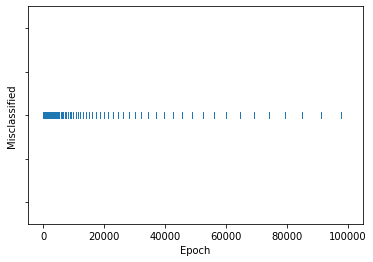

In [23]:
# Plot indicates lesser misclassifications as epoch increases. 
plt.plot(errors, '|')
plt.ylim(0.5,1.5)
plt.axes().set_yticklabels([])
plt.xlabel('Epoch')
plt.ylabel('Misclassified')
plt.show()

In [26]:
# First two are feature weights, thrid is bias : consistent with our input X
w 

array([ 1.58876117,  3.17458055, 11.11863105])

In [27]:
# Consider Test sample (-2, 4) : -ve sample
test = np.array([-2, 4, -1]) # Add Bias
np.sign(np.dot(test, w))

-1.0

In [29]:
# Consider Test sample (4, 3) : +ve sample
test = np.array([4, 3, -1]) # Add Bias
np.sign(np.dot(test, w))

1.0